<a href="https://colab.research.google.com/github/dleflef/Agentic_KnowledgeGraph_DigitalTwins/blob/main/Preliminary/notebooks/Agentic_Doc_Extraction/agentic_document_extraction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Document Understanding with Agentic Document Extraction

In this lab, you will use LandingAI's Agentic Document Extraction (ADE) framework to parse documents and extract key-value pairs using a single API. Note that Lab 4 has two parts. Here in the first part, we cover Exercise 1: Extract Key-Value Pairs from a Utility Bill and Exercise 2: ADE on Difficult Documents. In the second part, we cover Exercise 3: Automated Pipeline for Loan Applications.   

**Learning Objectives:**
- Use the Parse API to convert documents into structured markdown with visual grounding
- Define JSON schemas to extract specific fields from documents
- Use the Extract API to pull key-value pairs with source location references

## Background

ADE is built on three approaches:
- Vision-First: Documents are visual objects where meaning is encoded in layout, structure, and spatial relationships
- Data-Centric: Models are trained on large, diverse, and curated datasets
- Agentic: The system plans, decides, acts, and verifies until responses meet quality thresholds

The foundation is the **Document Pre-trained Transformer (DPT)** family of models that combine text parsing, layout detection, reading order, and multimodal reasoning capabilities.

## Outline

- [1. Setup and Authentication](#1)
- [2. Helper Functions](#2)
- [3. Exercise 1: Extract Key-Value Pairs from a Utility Bill](#3)
  - [3.1 Preview the Document](#3-1)
  - [3.2 Parse the Document](#3-2)
  - [3.3 Explore the Output from Parse](#3-3)
  - [3.4 Extract Key-Value Pairs](#3-4)
  - [3.5 Explore the Output from Extract](#3-5)
- [4. Exercise 2: ADE on Difficult Documents](#4)
  - [4.1 Charts and Flowcharts](#4-1)
  - [4.2 Tables with Missing Gridlines](#4-2)
  - [4.3 Handwritten Forms](#4-3)
  - [4.4 Handwritten Calculus](#4-4)
  - [4.5 Illustrations and Infographics](#4-5)
  - [4.6 Stamps and Signatures](#4-6)
- [5. Summary](#5)

<a id="1"></a>

## 1. Setup and Authentication

Import the required libraries. Key imports from LandingAI:
- `LandingAIADE`: Client for making API calls
- `ParseResponse`: Type for document parsing results
- `ExtractResponse`: Type for field extraction results

In [46]:
pip install pymupdf

In [47]:
pip install landingai_ade

In [48]:
# General imports

import os
import json
import pymupdf
import pandas as pd
from pathlib import Path
from dotenv import load_dotenv
from IPython.display import display, IFrame, Markdown, HTML
from IPython.display import Image as DisplayImage
from PIL import Image as PILImage, ImageDraw

In [49]:

# Imports specific to Agentic Document Extraction

from landingai_ade import LandingAIADE
from landingai_ade.types import ParseResponse, ExtractResponse

In [50]:
# Load environment variables from .env
_ = load_dotenv(override=True)

Initialize the ADE client. The API key is loaded automatically from the environment variable `VISION_AGENT_API_KEY`.

To use ADE outside this course, you can generate a free API key at [va.landing.ai](https://va.landing.ai).

In [51]:
# Initialize the client
client = LandingAIADE(
    apikey="***" # Paste your key here
)
print("Authenticated client initialized")

Authenticated client initialized


<a id="2"></a>

## 2. Helper Functions

Import visualization functions from `helper.py` to display documents and draw bounding boxes around detected chunks.

In [52]:
from helper import print_document, draw_bounding_boxes, draw_bounding_boxes_2
from helper import create_cropped_chunk_images

<a id="3"></a>

## 3. Exercise 1: Extract Key-Value Pairs from a Utility Bill

Parse a utility bill and extract specific fields like current charges, gas usage, and electric usage. The workflow:
1. Preview the document
2. Parse with DPT-2 to get structured markdown and chunks
3. Extract key-value pairs using a JSON schema

<p style="background-color:#f7fff8; padding:15px; border-width:3px; border-color:#e0f0e0; border-style:solid; border-radius:6px"> 🚨
&nbsp; <b>Different Run Results:</b> LandingAI continues to innovate with DPT-2. Considering updates to the model, your results might differ slightly from those shown in the video.</p>

<a id="3-1"></a>

### 3.1 Preview the Document

A combined gas and electric bill from a San Diego utility with monthly billing period, separate charges, and usage history charts.

In [53]:
print_document("/content/utility_bill.pdf")

<a id="3-2"></a>

### 3.2 Parse the Document

The Parse API converts the document into structured markdown with:
- Chunks: Semantic regions (text, tables, figures, logos, marginalia)
- Bounding boxes: Coordinates for each chunk
- Markdown: Text representation with embedded chunk IDs

Using `dpt-2-latest` provides the most current version of the DPT-2 model.

In [54]:
# Specify the file path to the document
document_path = Path("utility_bill.pdf")

print("⚡ Calling API to parse document...")

# Parse the document using the Parse() API
parse_result: ParseResponse = client.parse(
    document=document_path,
    model="dpt-2-latest"
)

print(f"Parsing completed.")
print(f"job_id: {parse_result.metadata.job_id}")
print(f"Filename: {parse_result.metadata.filename}")
print(f"Total time (ms): {parse_result.metadata.duration_ms}")
print(f"Total pages: {len(parse_result.splits)}")
print(f"Total markdown characters: {len(parse_result.markdown)}")
print(f"Total chunks: {len(parse_result.chunks)}")

⚡ Calling API to parse document...
Parsing completed.
job_id: 70c952d336644eb69a6f378cb0eec4dc
Filename: utility_bill.pdf
Total time (ms): 16536
Total pages: 1
Total markdown characters: 5758
Total chunks: 24


<a id="3-3"></a>

### 3.3 Explore the Output from Parse

The parse result contains the document structure. Visualize the detected chunks with bounding boxes.

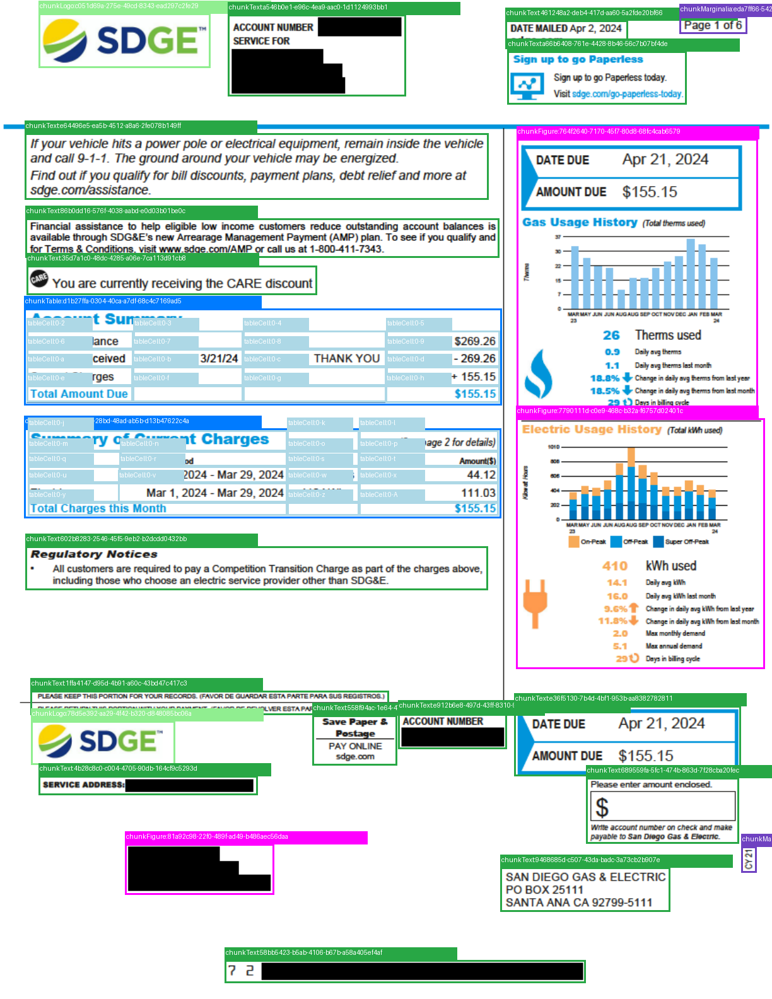

In [55]:
# Create and view an annotated version
draw_bounding_boxes(parse_result, document_path)

Each chunk has a unique ID, type, page number, and bounding box coordinates. Chunk types include: `logo`, `text`, `table`, `figure`, and `marginalia`.

In [56]:
# Inspect the first 5 chunks
parse_result.chunks[0:5]

[Chunk(id='c051d69a-275e-49cd-8343-ead297c2fe29', grounding=ChunkGrounding(box=ParseGroundingBox(bottom=0.06782948225736618, left=0.05029398947954178, right=0.2721189558506012, top=0.013683153316378593), page=0), markdown='<a id=\'c051d69a-275e-49cd-8343-ead297c2fe29\'></a>\n\n<::logo: SDGE\nSDGE\nA circular emblem with yellow, green, and blue curved stripes, accompanied by the word "SDGE" in green text.::>', type='logo'),
 Chunk(id='a546b0e1-e96c-4ea9-aac0-1d1124993bb1', grounding=ChunkGrounding(box=ParseGroundingBox(bottom=0.09613759070634842, left=0.2949819564819336, right=0.5256223678588867, top=0.014611378312110901), page=0), markdown="<a id='a546b0e1-e96c-4ea9-aac0-1d1124993bb1'></a>\n\nACCOUNT NUMBER [redacted]\nSERVICE FOR [redacted]", type='text'),
 Chunk(id='461248a2-deb4-417d-aa60-5a2fde20bf66', grounding=ChunkGrounding(box=ParseGroundingBox(bottom=0.048924438655376434, left=0.6548332571983337, right=0.8136134743690491, top=0.020226528868079185), page=0), markdown="<a id='46

In [57]:
print(f"The first chunk has an id: {parse_result.chunks[0].id}")
print(f"The first chunk is type: {parse_result.chunks[0].type}")
print(f"The first chunk is on page: {parse_result.chunks[0].grounding.page}")
print(f"The first chunk is at box coordinates: {parse_result.chunks[0].grounding.box}")

The first chunk has an id: c051d69a-275e-49cd-8343-ead297c2fe29
The first chunk is type: logo
The first chunk is on page: 0
The first chunk is at box coordinates: ParseGroundingBox(bottom=0.06782948225736618, left=0.05029398947954178, right=0.2721189558506012, top=0.013683153316378593)


In [58]:
# How many chunks of each type?
counts = {}

for chunk in parse_result.model_dump()["chunks"]:
    t = chunk["type"]
    counts[t] = counts.get(t, 0) + 1

print(counts)

{'logo': 2, 'text': 15, 'marginalia': 2, 'table': 2, 'figure': 3}


The top-level markdown contains the full document content with embedded chunk IDs. These IDs enable visual grounding namely tracing extracted values to their source location.

In [59]:
print("TOP-LEVEL MARKDOWN CONTENTS")
print(f"{parse_result.markdown[0:500]}")

TOP-LEVEL MARKDOWN CONTENTS
<a id='c051d69a-275e-49cd-8343-ead297c2fe29'></a>

<::logo: SDGE
SDGE
A circular emblem with yellow, green, and blue curved stripes, accompanied by the word "SDGE" in green text.::>

<a id='a546b0e1-e96c-4ea9-aac0-1d1124993bb1'></a>

ACCOUNT NUMBER [redacted]
SERVICE FOR [redacted]

<a id='461248a2-deb4-417d-aa60-5a2fde20bf66'></a>

DATE MAILED Apr 2, 2024
sdge.com

<a id='eda7ff66-5420-4ba0-a625-c8b959204541'></a>

Page 1 of 6

<a id='a66b6408-761e-4428-8b46-56c7b07bf4de'></a>

Sign up to go Pa


Tables are rendered as HTML with unique IDs for each cell. This enables extraction to reference specific table cells.

In [60]:
# Chunk-level markdown rendered
display(HTML(parse_result.chunks[9].markdown))

In [61]:
print(" ")
print("CHUNK-LEVEL MARKDOWN CONTENTS")
print(f"{parse_result.chunks[9].markdown}")

 
CHUNK-LEVEL MARKDOWN CONTENTS
<a id='b358de63-28bd-48ad-ab5b-d13b47622c4a'></a>

<table id="0-i">
<tr><td id="0-j" colspan="2">Summary of Current Charges</td><td id="0-k"></td><td id="0-l">(See page 2 for details)</td></tr>
<tr><td id="0-m"></td><td id="0-n">Billing Period</td><td id="0-o">Usage</td><td id="0-p">Amount($)</td></tr>
<tr><td id="0-q">Gas</td><td id="0-r">Mar 1, 2024 - Mar 29, 2024</td><td id="0-s">26 Therms</td><td id="0-t">44.12</td></tr>
<tr><td id="0-u">Electric</td><td id="0-v">Mar 1, 2024 - Mar 29, 2024</td><td id="0-w">410 kWh</td><td id="0-x">111.03</td></tr>
<tr><td id="0-y" colspan="2">Total Charges this Month</td><td id="0-z"></td><td id="0-A">$155.15</td></tr>
</table>


<a id="3-4"></a>

### 3.4 Extract Key-Value Pairs from the Document

Define a JSON schema specifying the fields to extract. The schema supports:
- Nested objects: (e.g., `account_summary` with sub-fields)
- Multiple types: `number`, `string`, `boolean`
- Rich descriptions: Guide the extraction model

More descriptive field definitions improve extraction accuracy.

In [62]:
schema_dict = {
    "type": "object",
    "title": "Utility Bill Field Extraction Schema",
    "properties": {
    "account_summary": {
      "type": "object",
      "title": "Account Summary",
      "properties": {
        "current_charges": {
          "type": "number",
          "description": "The charges incurred during the current billing "
            "period."
        },
        "total_amount_due": {
          "type": "number",
          "description": "The total amount currently due."
        }
      }
    },
    "gas_summary": {
      "type": "object",
      "title": "Gas Usage Summary",
      "properties": {
        "total_therms_used": {
          "type": "number",
          "description": "Total therms of gas used in the billing period."
        },
        "gas_current_charges": {
          "type": "number",
          "description": "The gas charges incurred during the current "
            "billing period."
        },
        "gas_usage_chart": {
          "type": "boolean",
          "description": "Does the document contain a chart of historical "
            "gas usage?"
        },
        "gas_max_month": {
          "type": "string",
          "description": "Which month has the highest historical gas usage? "
            "Return month name only."
        }
      }
    },
    "electric_summary": {
      "type": "object",
      "title": "Electric Usage Summary",
      "properties": {
        "total_kwh_used": {
          "type": "number",
          "description": "Total kilowatt hours of electricity used in the "
            "billing period."
        },
        "electric_current_charges": {
          "type": "number",
          "description": "The gas charges incurred during the current "
            "billing period."
        },
        "electric_usage_chart": {
          "type": "boolean",
          "description": "Does the document contain a chart of historical "
            "electric usage?"
        },
        "electric_max_month": {
          "type": "string",
          "description": "Which month has the highest historical electric "
            "usage? Return month name only."
        }
      }
    }
  }
}

# Convert the dictionary into a JSON-formatted string
schema_json = json.dumps(schema_dict)

Call the Extract API with the schema and markdown from the parse step. The Extract API uses the structured markdown from the Parse API to find the requested fields in the text.

In [63]:
print("⚡ Calling API to extract from the document...")

# Using the Extract() API to extract structured data using the schema
extraction_result: ExtractResponse = client.extract(
            schema=schema_json,
            markdown=parse_result.markdown, # Notice that the input used is the top-level markdown from the parse step
            model="extract-latest"
)

print(f"Extraction completed.")

⚡ Calling API to extract from the document...
Extraction completed.


<a id="3-5"></a>

### 3.5 Explore the Output from Extract

The extraction result contains:
- extraction: The extracted values matching your schema
- extraction_metadata: References to source chunk/cell IDs for each value

In [64]:
# View all extracted values
extraction_result.extraction

{'account_summary': {'current_charges': 155.15, 'total_amount_due': 155.15},
 'gas_summary': {'total_therms_used': 26,
  'gas_current_charges': 44.12,
  'gas_usage_chart': True,
  'gas_max_month': 'JAN'},
 'electric_summary': {'total_kwh_used': 410,
  'electric_current_charges': 111.03,
  'electric_usage_chart': True,
  'electric_max_month': 'JAN'}}

The metadata provides visual grounding. Short IDs like `0-a` refer to table cells, while longer UUIDs refer to figure or text chunks. This enables verification UIs that highlight the exact source of each extracted value.

In [65]:
# View all metadata for extracted values
extraction_result.extraction_metadata

{'account_summary': {'current_charges': {'value': 155.15,
   'references': ['0-d']},
  'total_amount_due': {'value': 155.15, 'references': ['0-h']}},
 'gas_summary': {'total_therms_used': {'value': 26, 'references': ['0-s']},
  'gas_current_charges': {'value': 44.12, 'references': ['0-t']},
  'gas_usage_chart': {'value': True,
   'references': ['764f2640-7170-45f7-80d8-68fc4cab6579']},
  'gas_max_month': {'value': 'JAN',
   'references': ['764f2640-7170-45f7-80d8-68fc4cab6579']}},
 'electric_summary': {'total_kwh_used': {'value': 410, 'references': ['0-w']},
  'electric_current_charges': {'value': 111.03, 'references': ['0-x']},
  'electric_usage_chart': {'value': True,
   'references': ['7790111d-c0e9-468c-b32a-f6757d02401c']},
  'electric_max_month': {'value': 'JAN',
   'references': ['7790111d-c0e9-468c-b32a-f6757d02401c']}}}

<a id="4"></a>

## 4. Exercise 2: ADE Performance on Difficult-to-Parse Documents

See how ADE handles document types that are challenging for traditional OCR and VLM approaches:
- Charts and flowcharts with complex spatial relationships
- Tables with missing gridlines and merged cells
- Handwritten forms with checkboxes and circles
- Illustrations without text
- Official stamps and signatures

The same API and DPT model handles all of these without additional configuration.

In [66]:
def parse_document(parse_filename: str, model = "dpt-2-latest",
                   display_option = "HTML") -> ParseResponse:
    """
    Parse a document with ADE and display the result in the desired format.

    Args:
        parse_filename: Path to the document to parse.
        display_option: One of:
            - "Raw Markdown" : print the markdown as plain text
            - "HTML"         : render the markdown as HTML in the notebook

    Returns:
        ParseResponse: The full parse response object.
    """

    document_path = Path(parse_filename)

    print("⚡ Calling API to parse document...")

    full_parse_result: ParseResponse = client.parse(
        #send document to Parse API
        document=document_path,
        model=model
    )

    _ = draw_bounding_boxes(full_parse_result, document_path=document_path)

    print(f"Parsing completed.")
    print(f"job_id: {full_parse_result.metadata.job_id}")
    print(f"Total pages: {len(full_parse_result.splits)}")
    print(f"Total time (ms): {full_parse_result.metadata.duration_ms}")
    print(f"Total markdown characters: {len(full_parse_result.markdown)}")
    print(f"Number of chunks: {len(full_parse_result.chunks)}")
    print(f" ")
    print("Complete Markdown:")

    if display_option == "Raw Markdown":
        print("Complete Markdown (raw):")
        print(full_parse_result.markdown)

    elif display_option == "HTML":
        print("Rendering markdown as HTML...")
        display(HTML(full_parse_result.markdown))

    else:
        print(
            f"[Unknown display_option '{display_option}'; "
            "valid options are 'Raw Markdown' or 'HTML'. "
            "Defaulting to HTML.]"
        )
        display(HTML(full_parse_result.markdown))

<a id="4-1"></a>

### 4.1 Charts and Flowcharts

Charts encode meaning through bars, lines, and spatial relationships. Flowcharts use arrows to show connections that don't follow standard reading order.

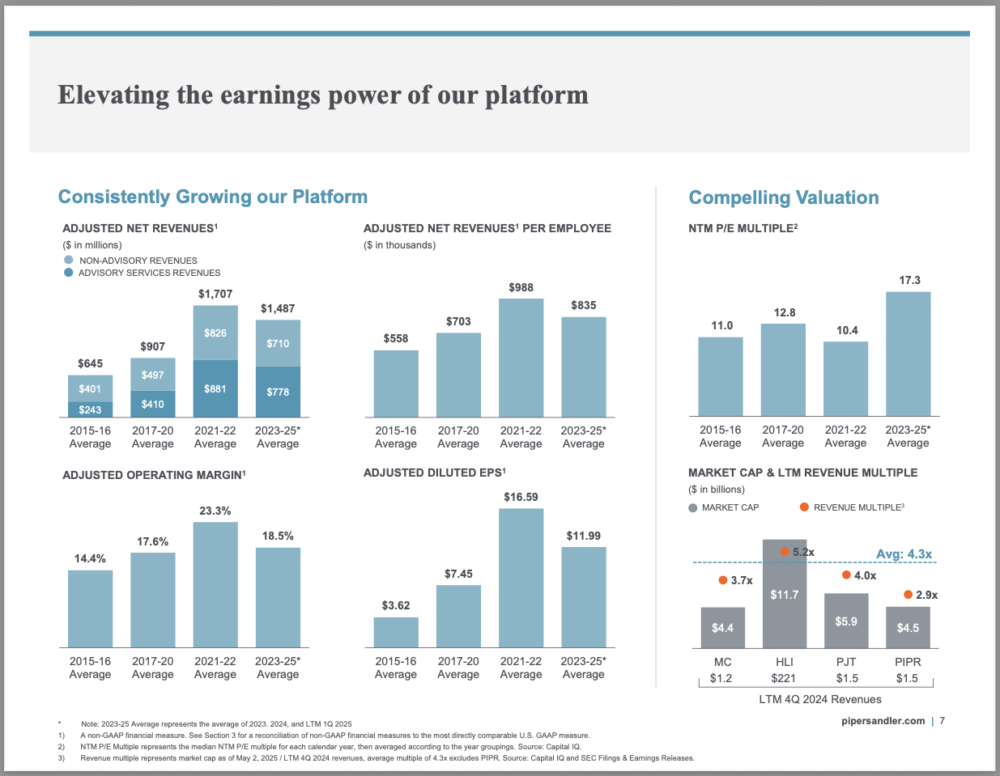

In [67]:
print_document("Investor_Presentation_pg7.png")

⚡ Calling API to parse document...


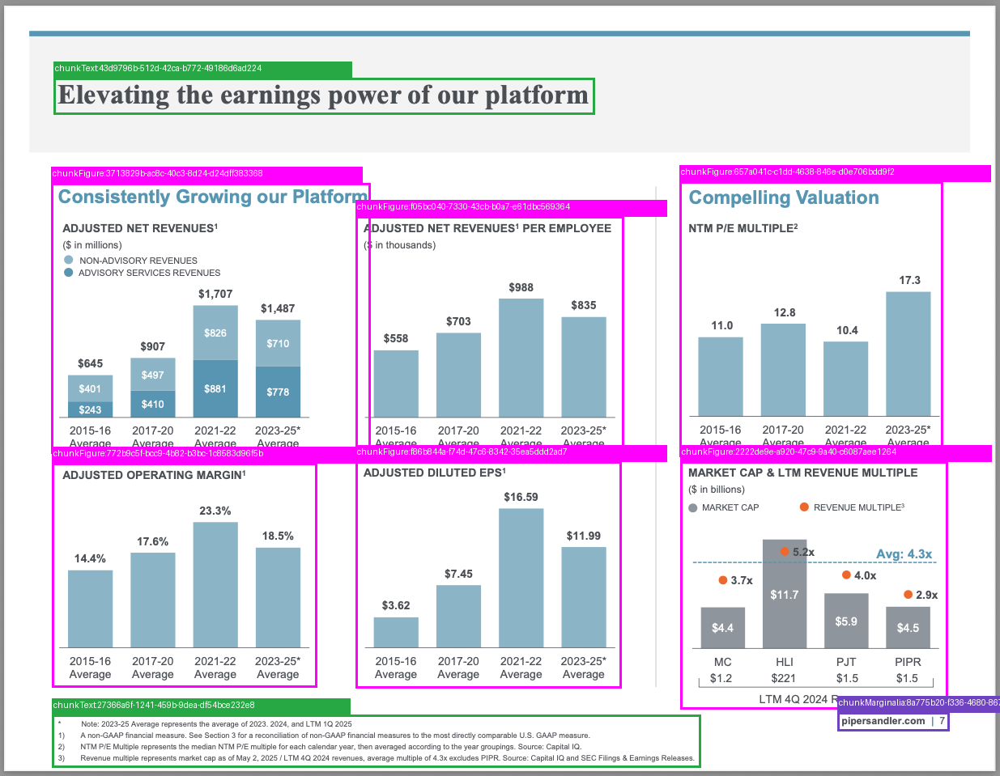

Parsing completed.
job_id: 8db64d1e062c4792a09f87f1b3f9afcd
Total pages: 1
Total time (ms): 7730
Total markdown characters: 3306
Number of chunks: 9
 
Complete Markdown:
Complete Markdown (raw):
<a id='43d9796b-512d-42ca-b772-49186d6ad224'></a>

Elevating the earnings power of our platform

<a id='3713829b-ac8c-40c3-8d24-d24dff383368'></a>

<::Consistently Growing our Platform
ADJUSTED NET REVENUES¹
($ in millions)

Legend:
NON-ADVISORY REVENUES (light blue)
ADVISORY SERVICES REVENUES (dark blue)

Stacked bar chart showing adjusted net revenues over different average periods:

- **2015-16 Average**:
  - Total: $645
  - NON-ADVISORY REVENUES: $401
  - ADVISORY SERVICES REVENUES: $243

- **2017-20 Average**:
  - Total: $907
  - NON-ADVISORY REVENUES: $497
  - ADVISORY SERVICES REVENUES: $410

- **2021-22 Average**:
  - Total: $1,707
  - NON-ADVISORY REVENUES: $826
  - ADVISORY SERVICES REVENUES: $881

- **2023-25* Average**:
  - Total: $1,487
  - NON-ADVISORY REVENUES: $710
  - ADVISORY 

In [68]:
parse_document("Investor_Presentation_pg7.png",
               display_option = "Raw Markdown")

This HR flowchart has arrows pointing in multiple directions. Traditional OCR would fail because "Select candidate" appears *above* "Good reference" on the page, but logically follows it in the workflow.

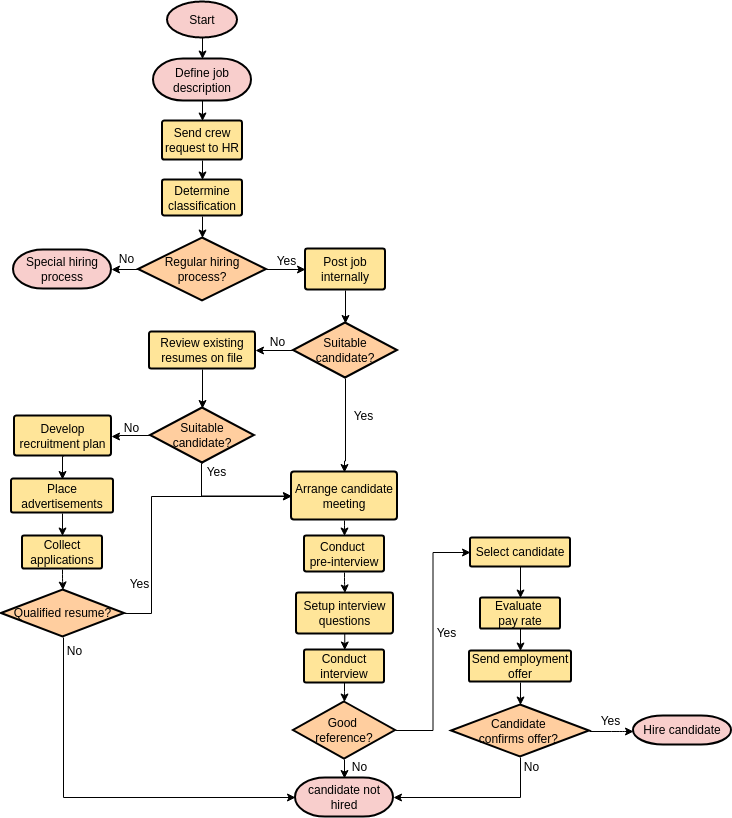

In [69]:
print_document("hr_process_flowchart.png")

⚡ Calling API to parse document...


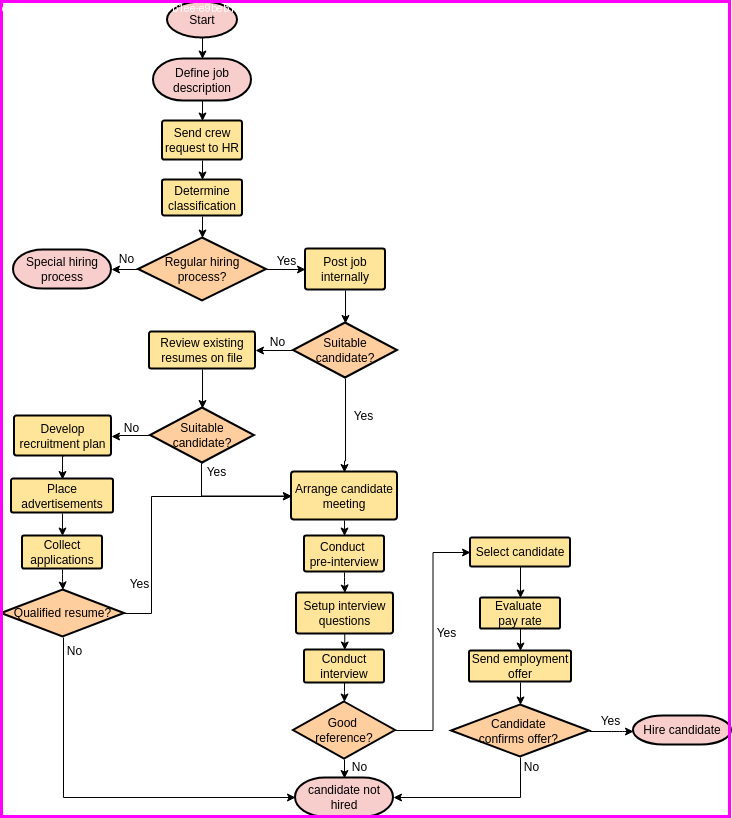

Parsing completed.
job_id: 4f7250a48e8b4d5ca82c213e3e19f2b7
Total pages: 1
Total time (ms): 7341
Total markdown characters: 1019
Number of chunks: 1
 
Complete Markdown:
Rendering markdown as HTML...


In [70]:
parse_document("hr_process_flowchart.png",
               display_option = "HTML")

<a id="4-2"></a>

### 4.2 Tables with Many Cells, Missing Gridlines, and Merged Cells

Real-world tables often lack clear gridlines, have merged header cells, or contain blank cells. ADE handles these by understanding the visual structure.

In [71]:
print_document("virology_pg2.pdf")

⚡ Calling API to parse document...


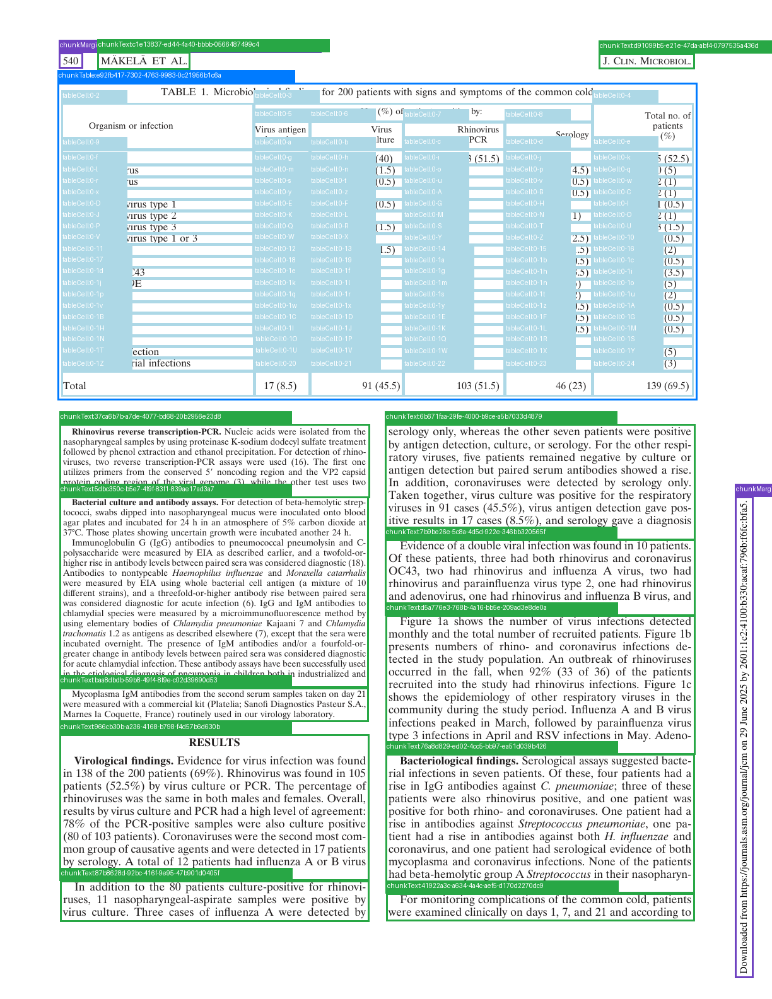

Parsing completed.
job_id: 4b91ce8e138c457782420ee7d86ffaa5
Total pages: 1
Total time (ms): 11002
Total markdown characters: 9586
Number of chunks: 15
 
Complete Markdown:
Rendering markdown as HTML...


In [72]:
parse_document("virology_pg2.pdf",
               display_option = "HTML")

This "mega table" has over 1,000 cells with merged rows and columns. LLMs typically hallucinate on large tables because they can't hold all the numbers in context. The agentic approach processes tables visually, avoiding this limitation.

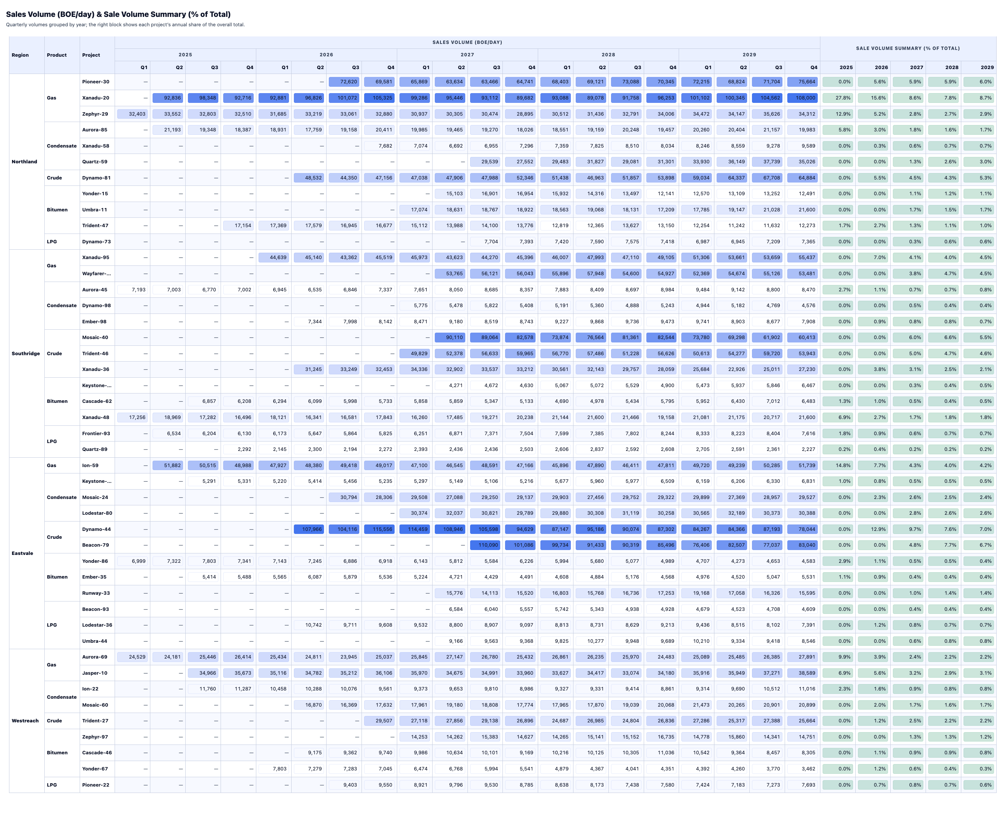

In [73]:
print_document("sales_volume.png")

⚡ Calling API to parse document...


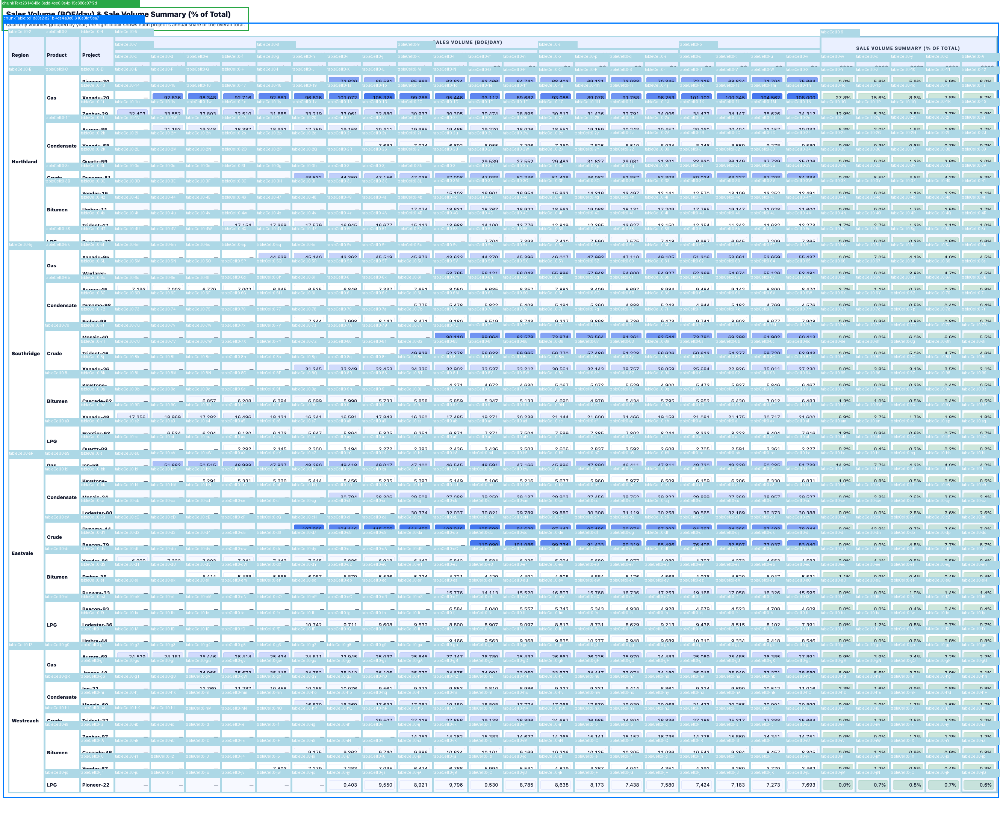

Parsing completed.
job_id: 4344b389d99d4d5ab8f3e5f2541edb58
Total pages: 1
Total time (ms): 17019
Total markdown characters: 30222
Number of chunks: 2
 
Complete Markdown:
Rendering markdown as HTML...


In [74]:
parse_document("sales_volume.png",
               display_option = "HTML")

<a id="4-3"></a>

### 4.3 Handwritten Form with Checkboxes and Circles

This patient intake form combines handwriting, checkboxes, and circled selections. ADE detects these interaction patterns and converts them to structured markdown.

In [75]:
print_document("patient_intake.pdf")

⚡ Calling API to parse document...


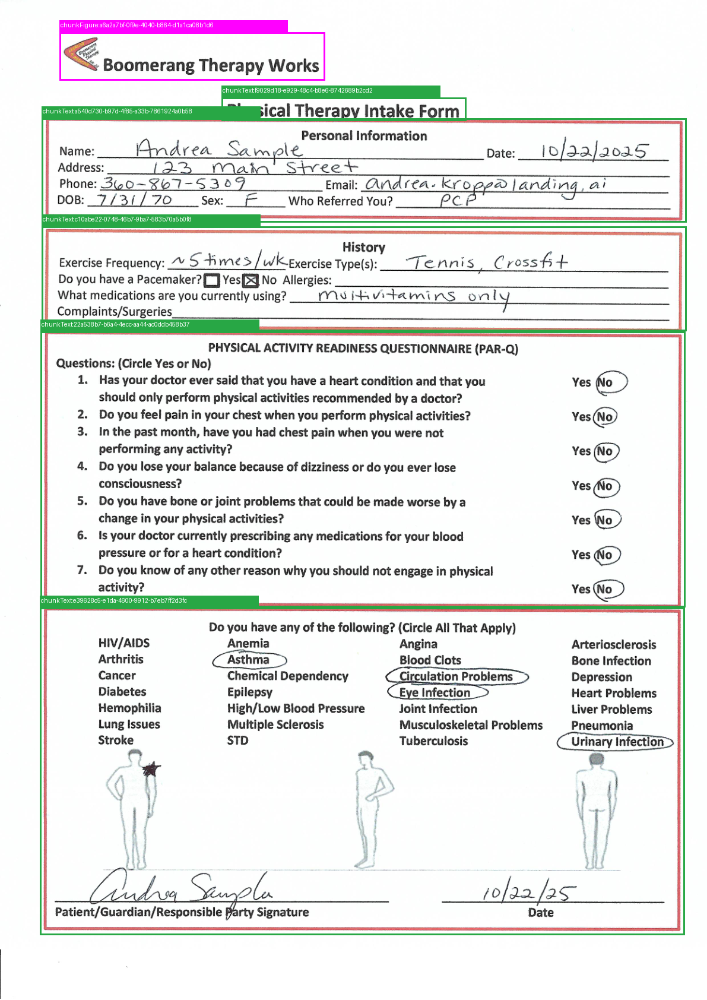

Parsing completed.
job_id: 830b9b847974464d8daf82bddc4f3fd1
Total pages: 1
Total time (ms): 19888
Total markdown characters: 2565
Number of chunks: 6
 
Complete Markdown:
Complete Markdown (raw):
<a id='a6a2a7bf-0f9e-4040-b864-d1a1ca08b1d6'></a>

<::
EXERCISE
Boomerang
Physical
Therapy
dr. Liz
: figure::>

Boomerang Therapy Works

<a id='f9029d18-e929-48c4-b8e6-8742689b2cd2'></a>

Physical Therapy Intake Form

<a id='a540d730-b97d-4f85-a33b-7861924a0b58'></a>

Personal Information

Name: Andrea Sample
Address: 123 Main Street
Phone: 360-867-5309
DOB: 7/31/70

Date: 10/22/2025
Email: andrea.kropp@landing.ai

Sex: F
Who Referred You? PCP

<a id='c10abe22-0748-46b7-9ba7-583b70a5b0f8'></a>

History

Exercise Frequency: ~5 times/wk
Exercise Type(s): Tennis, Crossfit
Do you have a Pacemaker?
option Yes: [ ]
option No: [x]
Allergies:
What medications are you currently using? multivitamins only
Complaints/Surgeries: _

<a id='22a538b7-b6a4-4ecc-aa44-ac0ddb458b37'></a>

PHYSICAL ACTIVITY READIN

In [76]:
parse_document("patient_intake.pdf",
               display_option = "Raw Markdown")

<a id="4-4"></a>

### 4.4 Handwritten Calculus Answer Sheet

Mathematical notation like integrals, square roots, and fractions requires understanding visual symbols. ADE can parse handwritten math into structured representations.

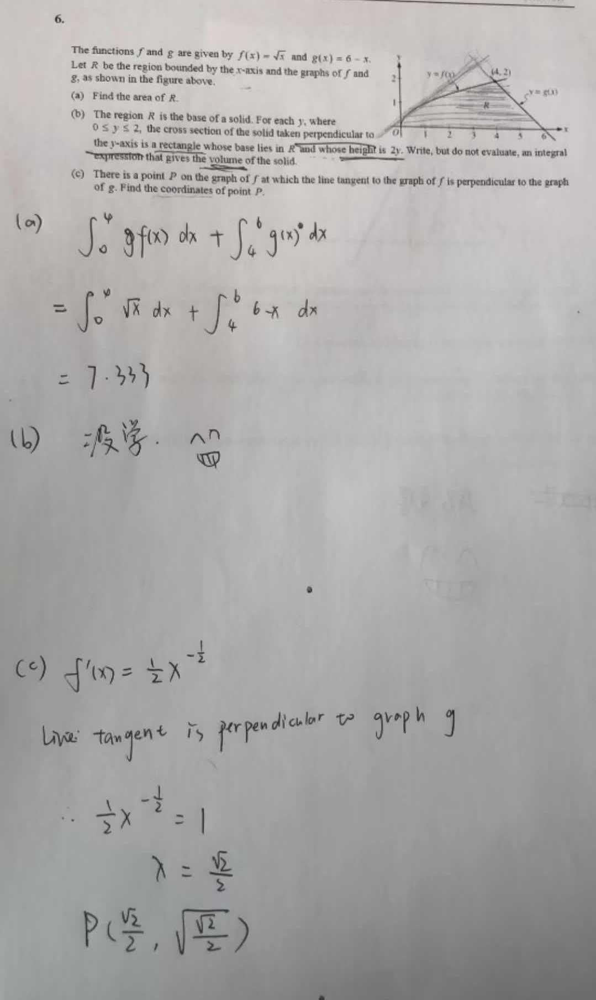

In [77]:
print_document("calculus_BC_answer_sheet.jpg")

⚡ Calling API to parse document...


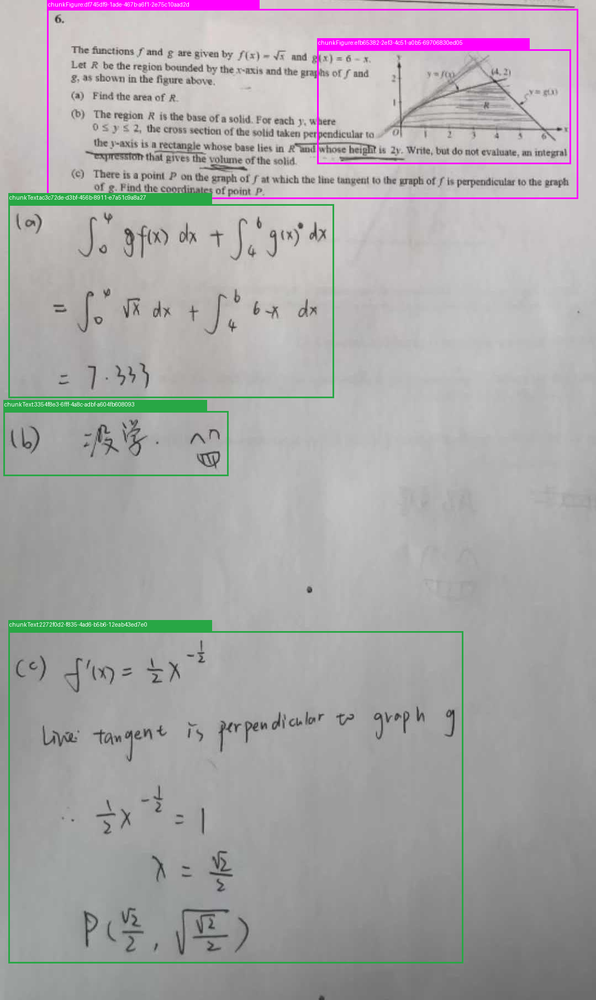

Parsing completed.
job_id: 7f3e99db0bfc472e80047f904456c538
Total pages: 1
Total time (ms): 7950
Total markdown characters: 1928
Number of chunks: 5
 
Complete Markdown:
Rendering markdown as HTML...


In [78]:
parse_document("calculus_BC_answer_sheet.jpg", display_option = "HTML")

<a id="4-5"></a>

### 4.5 Illustrations and Infographics

Some documents contain no text - only illustrations. For these, use `dpt-1-latest` which provides more detailed figure descriptions.

In [79]:
print_document("ikea-assembly.pdf")

⚡ Calling API to parse document...


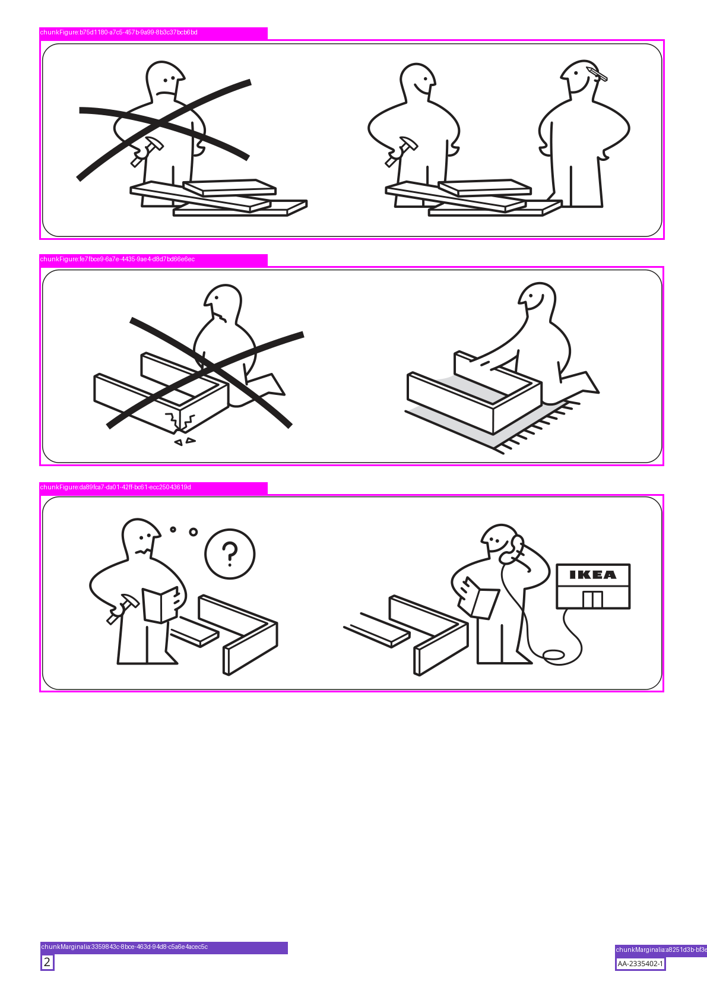

Parsing completed.
job_id: caabb86be7a5456d94c0ae8e0947e60f
Total pages: 1
Total time (ms): 7235
Total markdown characters: 4161
Number of chunks: 5
 
Complete Markdown:
Complete Markdown (raw):
<a id='b75d1180-a7c5-457b-9a99-8b3c37bcb6bd'></a>

Summary : This instructional illustration shows the correct and incorrect way to perform a task involving two people and wooden planks, likely related to safety or teamwork.

illustration:  
# Scene Overview :  
  • The image is divided into two panels.  
  • Left panel: One person stands alone holding a hammer, with several wooden planks on the ground. A large "X" is drawn over this person, indicating this is incorrect.  
  • Right panel: Two people stand together, one holding a hammer and the other with a pencil behind their ear, with the same wooden planks on the ground. Both appear to be communicating or collaborating.

# Technical Details :  
  • Simple black-and-white line drawing.  
  • No text, numbers, or additional symbols except for 

In [80]:
parse_document("ikea-assembly.pdf",
               model = "dpt-1-latest",
               display_option = "Raw Markdown")

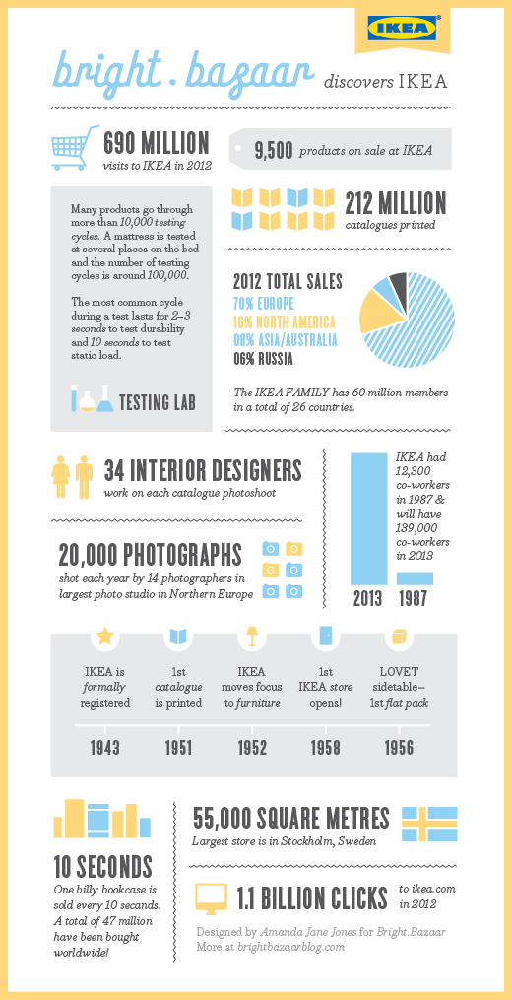

In [81]:
print_document("ikea_infographic.jpg")

⚡ Calling API to parse document...


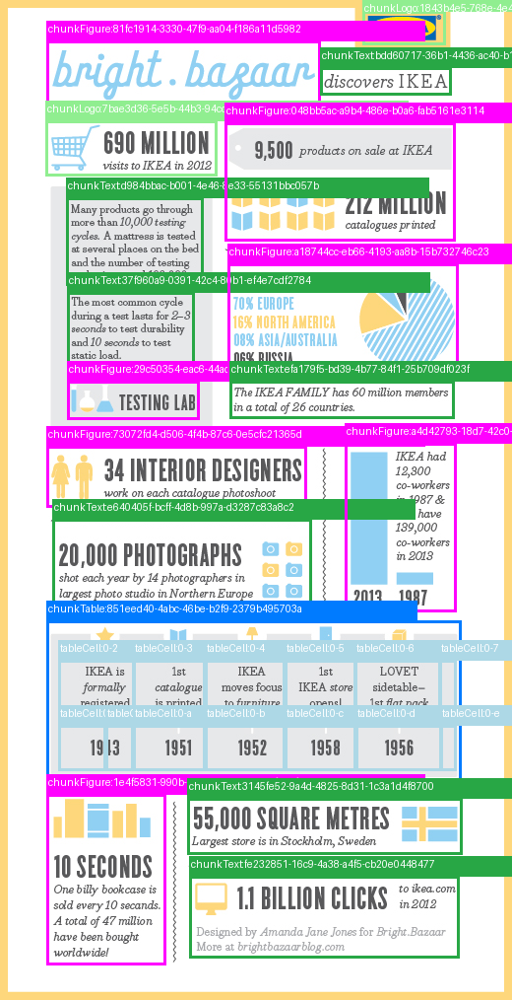

Parsing completed.
job_id: e877d7064abd4fffad7a0ac790e84a7a
Total pages: 1
Total time (ms): 16027
Total markdown characters: 3154
Number of chunks: 17
 
Complete Markdown:
Complete Markdown (raw):
<a id='1843b4e5-768e-4e4d-90d9-907891141f83'></a>

<::logo: IKEA
IKEA
Blue text inside a yellow oval with a thin yellow rectangular border.::>

<a id='81fc1914-3330-47f9-aa04-f186a11d5982'></a>

<::bright . bazaar
: figure::>

<a id='bdd60717-36b1-4436-ac40-b1a665931952'></a>

discovers IKEA

<a id='7bae3d36-5e5b-44b3-94cd-499aef679fd5'></a>

<::logo: IKEA
690 MILLION
visits to IKEA in 2012
A light blue shopping cart icon is prominently featured next to the text.::>

<a id='d984bbac-b001-4e46-8e33-55131bbc057b'></a>

Many products go through
more than 10,000 testing
cycles. A mattress is tested
at several places on the bed
and the number of testing
cycles is around 100,000.

<a id='37f960a9-0391-42c4-80b1-ef4e7cdf2784'></a>

The most common cycle
during a test lasts for 2-3
seconds to test du

In [82]:
parse_document("ikea_infographic.jpg",
               display_option = "Raw Markdown")

<a id="4-6"></a>

### 4.6 Certificate of Origin with Stamps and Signatures

Official documents often contain stamps with curved text and handwritten signatures. ADE detects these as `attestation` chunk types and extracts their content.

In [83]:
print_document("certificate_of_origin.pdf")

⚡ Calling API to parse document...


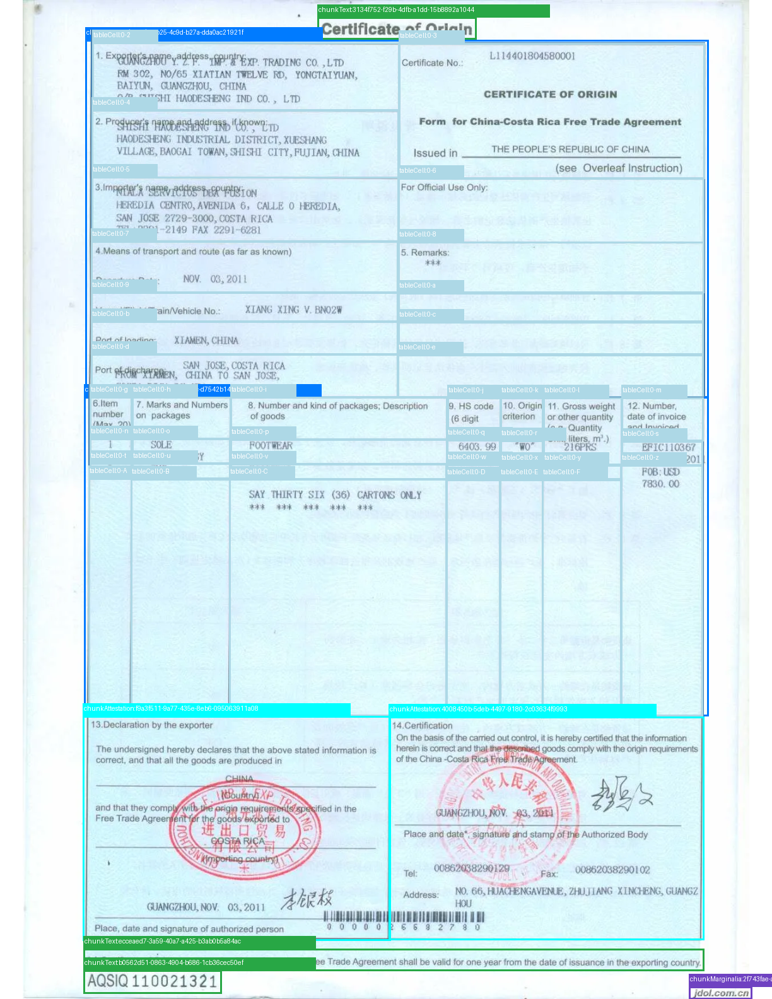

Parsing completed.
job_id: fbdf61a0c36244c7b7985c9cbccd5f00
Total pages: 1
Total time (ms): 7205
Total markdown characters: 4201
Number of chunks: 8
 
Complete Markdown:
Rendering markdown as HTML...


In [45]:
parse_document("certificate_of_origin.pdf",
               display_option = "HTML")

<a id="5"></a>

## 5. Summary

Here's what we learned about LandingAI's ADE framework:

| Concept | Description |
|---------|-------------|
| **Parse API** | Converts documents to structured markdown with chunks, bounding boxes, and unique IDs |
| **Extract API** | Pulls key-value pairs using JSON schemas with references for visual grounding |
| **DPT Models** | Document Pre-trained Transformers (DPT-2) that understand documents visually |
| **Chunk Types** | `logo`, `text`, `table`, `figure`, `marginalia`, `attestation` |
| **Visual Grounding** | Each extracted value references its source chunk |

In the next lab, you will build a complete document processing pipeline for loan automation using document categorization and extraction schemas.